https://colab.research.google.com/drive/1YmeZAEXl0IX08OMRjq6e3pHYxS-VCsxe#scrollTo=RqCk_Y1IoVLW

In [1]:
import sklearn
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
file_id = "117LO2wPC6D-Dr2LfkIVZfZDWrVMoEIGR"
url = f'https://drive.google.com/uc?id={file_id}'
df = pd.read_csv(url)

In [3]:
df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


# A

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


no missing values (either None or zero values for continous features)

In [5]:
age_missing = (df['age'] == 0).values.any()
bmi_missing = (df['bmi'] == 0).values.any()
charges_missing = (df['charges'] == 0).values.any()
print(age_missing, bmi_missing, charges_missing)

False False False


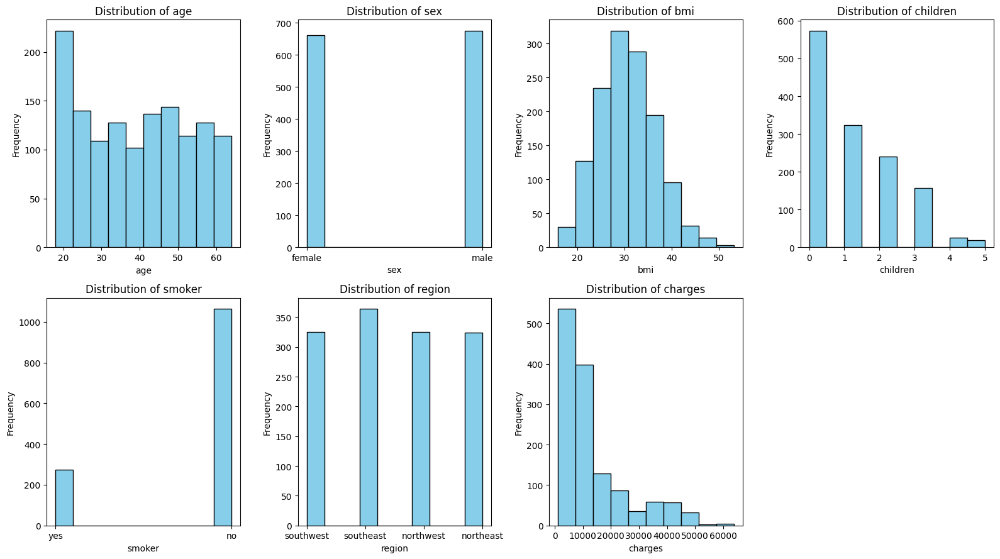

In [6]:
fig, axes = plt.subplots(2, 4,figsize = (16,9))

axes = axes.flatten()


for i, column in enumerate(df.columns):
    plt.subplot(2, 4, i + 1)  # Create a subplot
    plt.hist(df[column], bins=10, color='skyblue', edgecolor='black')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
axes = axes.flatten()
axes[-1].axis('off')

plt.tight_layout()
plt.show()

preprocessing

In [7]:
categorical_feats = ['sex','smoker', 'region']
unique_values = {col: set(df[col].unique()) for col in categorical_feats}

# Displaying the unique values in each column
for col, unique_set in unique_values.items():
    print(f"Unique values in {col}: {unique_set}")

Unique values in sex: {'female', 'male'}
Unique values in smoker: {'no', 'yes'}
Unique values in region: {'northwest', 'northeast', 'southeast', 'southwest'}


* binary mapping for *sex* and *smoker* features
* for *region* we use one-hot encoding

In [8]:
df['sex'] = df['sex'].map({'male': 0, 'female': 1})
df['smoker'] = df['smoker'].map({'yes': 1, 'no': 0})
df = pd.get_dummies(df, columns=['region'], prefix='region')
# aslo drop the target column
X = df.drop(columns=['charges'])
y = df['charges']

In [9]:
print(X.info())
(X.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               1338 non-null   int64  
 1   sex               1338 non-null   int64  
 2   bmi               1338 non-null   float64
 3   children          1338 non-null   int64  
 4   smoker            1338 non-null   int64  
 5   region_northeast  1338 non-null   bool   
 6   region_northwest  1338 non-null   bool   
 7   region_southeast  1338 non-null   bool   
 8   region_southwest  1338 non-null   bool   
dtypes: bool(4), float64(1), int64(4)
memory usage: 57.6 KB
None


,age,sex,bmi,children,smoker,region_northeast,region_northwest,region_southeast,region_southwest
0,19,1,27.900,0,1,False,False,False,True
1,18,0,33.770,1,0,False,False,True,False
2,28,0,33.000,3,0,False,False,True,False
3,33,0,22.705,0,0,False,True,False,False
4,32,0,28.880,0,0,False,True,False,False


In [10]:
y.head()

,charges
0,16884.92400
1,1725.55230
2,4449.46200
3,21984.47061
4,3866.85520


map True/False values to 1/0

In [11]:
for col in X.columns:
  X[col] = X[col].map({True: 1, False: 0}) if X[col].dtype == 'bool' else X[col]

In [12]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               1338 non-null   int64  
 1   sex               1338 non-null   int64  
 2   bmi               1338 non-null   float64
 3   children          1338 non-null   int64  
 4   smoker            1338 non-null   int64  
 5   region_northeast  1338 non-null   int64  
 6   region_northwest  1338 non-null   int64  
 7   region_southeast  1338 non-null   int64  
 8   region_southwest  1338 non-null   int64  
dtypes: float64(1), int64(8)
memory usage: 94.2 KB


z-score normalization on continous features should be done **after** splitting
to avoid any kind of data leaks.

In [13]:
from sklearn.preprocessing import StandardScaler
continuous_feats = ['age', 'bmi', 'children']

split dataset using different train/test ratios and performin z-score normalization on each of them seprately.

In [14]:
from sklearn.model_selection import train_test_split

ratios = [0.85, 0.80, 0.75,0.70]
splits = {}

for ratio in ratios:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1 - ratio, random_state=42)

    # Scale continuous features in X_train and X_test
    scaler = StandardScaler()
    X_train[continuous_feats] = scaler.fit_transform(X_train[continuous_feats])
    X_test[continuous_feats] = scaler.transform(X_test[continuous_feats])

    splits[f'{int(ratio*100)}-{int((1-ratio)*100)}'] = {
        'train': (X_train, y_train),
        'test': (X_test, y_test)
    }

for ratio, split in splits.items():
    train_X, train_y = split['train']
    test_X, test_y = split['test']
    print(f"Train/Test Split: {ratio}")
    print(f"Train Data X shape: {train_X.shape}, y shape: {train_y.shape}")
    print(f"Test Data X shape: {test_X.shape}, y shape: {test_y.shape}")
    print("#########################")

Train/Test Split: 85-15
Train Data X shape: (1137, 9), y shape: (1137,)
Test Data X shape: (201, 9), y shape: (201,)
#########################
Train/Test Split: 80-19
Train Data X shape: (1070, 9), y shape: (1070,)
Test Data X shape: (268, 9), y shape: (268,)
#########################
Train/Test Split: 75-25
Train Data X shape: (1003, 9), y shape: (1003,)
Test Data X shape: (335, 9), y shape: (335,)
#########################
Train/Test Split: 70-30
Train Data X shape: (936, 9), y shape: (936,)
Test Data X shape: (402, 9), y shape: (402,)
#########################


# B

trying different loss functions (MSE, RMSE and MAE) for a dataset of choice

In [15]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

model = LinearRegression()

train = splits['75-25']['train']
test = splits['75-25']['test']
model.fit(train[0], train[1])
y_pred = model.predict(test[0])

mse = mean_squared_error(test[1], y_pred)
r2 = r2_score(test[1], y_pred) # how well the model is fitted on y data
mae = mean_absolute_error(test[1], y_pred)
rmse = np.sqrt(mse)
print(f"Mean Absolute Error: {mae}")
print("Mean Squared Error:", mse)
print(f"Root Mean Squared Error:{rmse}")
print("R-squared:", r2)

Mean Absolute Error: 4243.654116653147
Mean Squared Error: 35117755.73613632
Root Mean Squared Error:5926.023602394469
R-squared: 0.7672642952734356


| Metric         | Sensitivity to Outliers | Units          | Pros                                              | Cons                                              |
|----------------|--------------------------|----------------|---------------------------------------------------|---------------------------------------------------|
| **MSE**        | High                     | Squared units  | Penalizes large errors heavily, useful for identifying problematic predictions. | Harder to interpret due to squared scale.         |
| **RMSE**       | High                     | Same as target | Easier to interpret (same units as target), widely used in reporting regression results. | Still sensitive to outliers.                     |
| **MAE**        | Low                      | Same as target | Robust to outliers, easy to interpret as the average error. | Does not penalize large errors strongly.          |


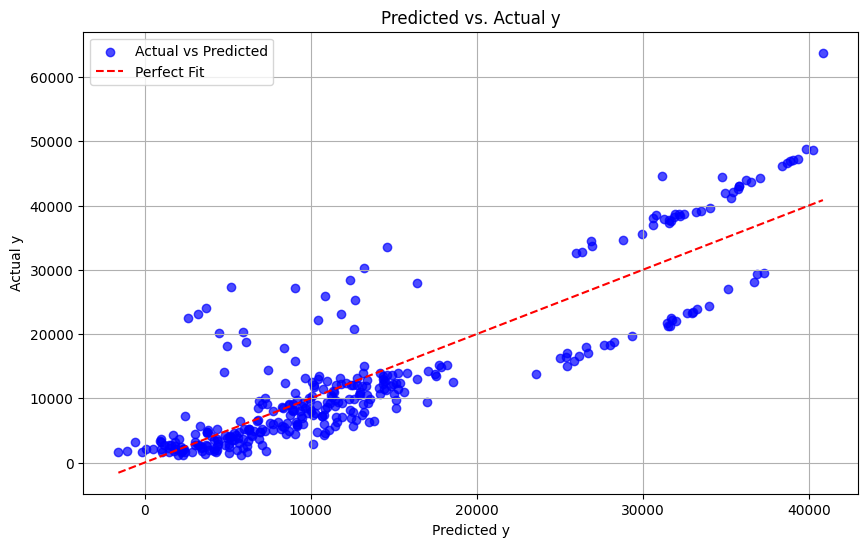

In [16]:
# Plot predicted y vs. actual y
plt.figure(figsize=(10, 6))

# Scatter plot: x-axis = predicted y, y-axis = actual y
plt.scatter(y_pred, test[1], alpha=0.7, color='blue', label='Actual vs Predicted')

# Add a reference line for perfect predictions
plt.plot([y_pred.min(), y_pred.max()], [y_pred.min(), y_pred.max()], 'r--', label='Perfect Fit')

plt.xlabel("Predicted y")
plt.ylabel("Actual y")
plt.title("Predicted vs. Actual y")
plt.legend()
plt.grid()
plt.show()


RMSE is chosen since it intrepretable and is also more sensitive to outliers and it is observable that we have outliers in our dataset which are model has performed poorly on them.(y values over 45000 are considered outliers)

Trying different train/test splits

In [21]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Initialize the results list
results = []

# Iterate over the splits
for split_name, split_data in splits.items():
    train = split_data['train']
    test = split_data['test']

    # Fit the Linear Regression model
    model = LinearRegression()
    model.fit(train[0], train[1])

    # Predict on the test set
    y_pred = model.predict(test[0])

    # Calculate RMSE and R²
    mse = mean_squared_error(test[1], y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(test[1], y_pred)

    # Append the results
    results.append({
        'Train-Test Split': split_name,
        'RMSE': rmse,
        'R2 Score': r2
    })

# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Display the DataFrame
print(results_df)


  Train-Test Split         RMSE  R2 Score
0            85-15  5552.750545  0.797508
1            80-19  5796.284659  0.783593
2            75-25  5926.023602  0.767264
3            70-30  5812.100272  0.769612


so from further on we use 85-15 split as our train/test.

In [22]:
splits['85-15']['train'][1]

,charges
331,24393.62240
796,4266.16580
1039,22493.65964
261,17085.26760
70,16577.77950
...,...
1095,4561.18850
1130,8582.30230
1294,11931.12525
860,46113.51100


# C

In [23]:
X_train = splits['85-15']['train'][0]
y_train = splits['85-15']['train'][1]
X_test = splits['85-15']['test'][0]
y_test = splits['85-15']['test'][1]

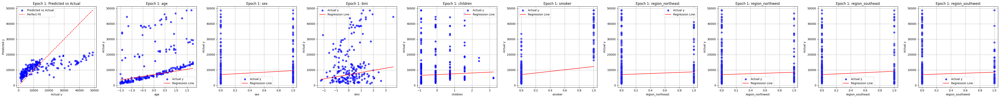

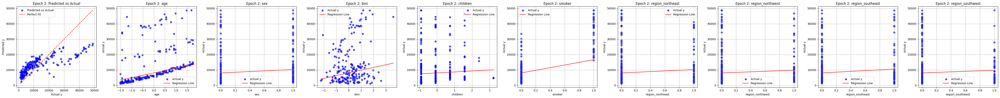

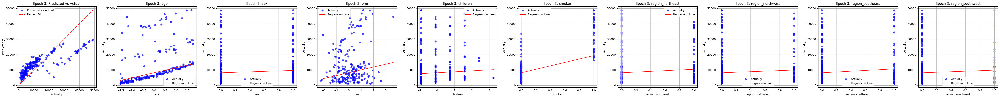

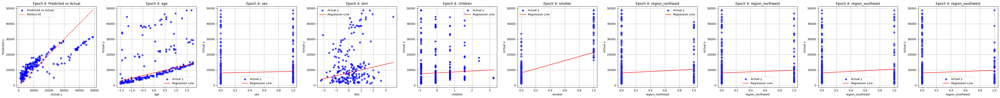

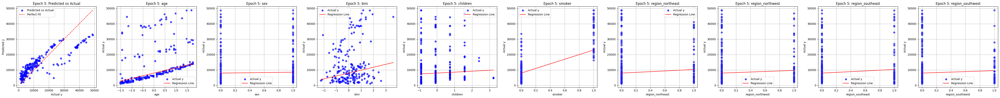

...

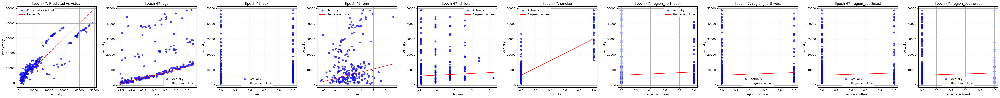

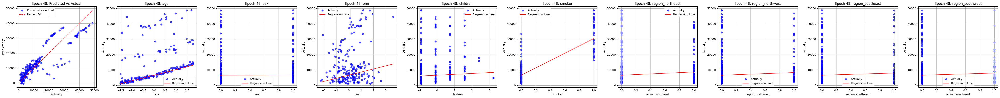

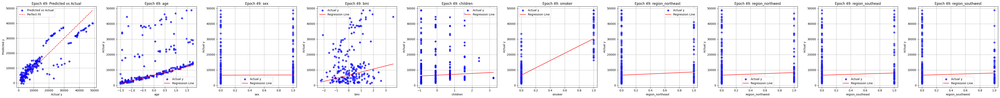

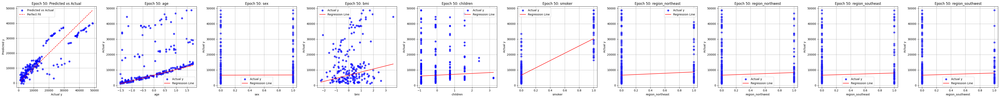

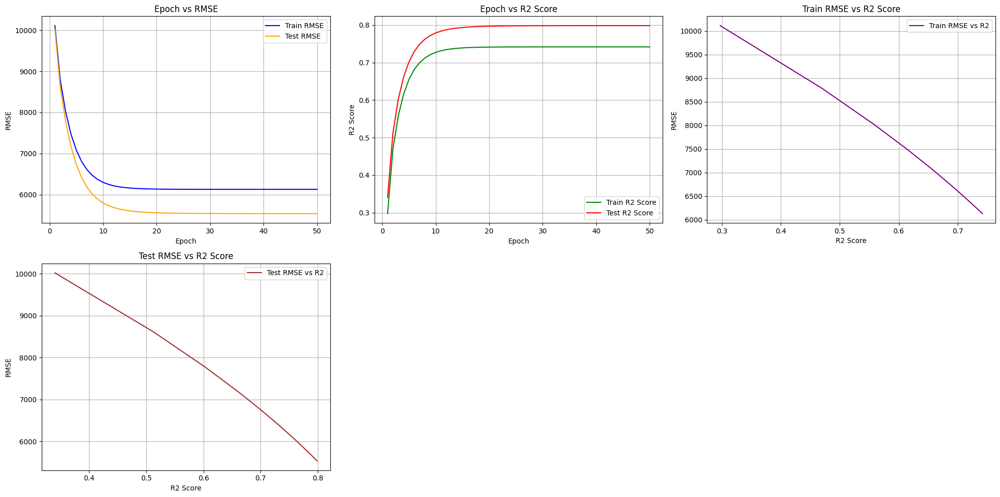

final RMSE:5538.742410572953
final r2 score0.798528109310538


In [24]:
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

# Initialize SGDRegressor
sgd_reg = SGDRegressor(max_iter=1, eta0=0.001, learning_rate='constant', penalty='l2', random_state=42, warm_start=True)

n_epochs = 50
n_features = X_train.shape[1]

# Feature names
feature_names = X_train.columns if isinstance(X_train, pd.DataFrame) else [f"Feature {i+1}" for i in range(n_features)]

# Track metrics over epochs
train_rmse = []
train_r2 = []
test_rmse = []
test_r2 = []

weights_over_epochs = []


# Loop over epochs
for epoch in range(n_epochs):
    # Perform one epoch of training
    sgd_reg.partial_fit(X_train, y_train)

    weights_over_epochs.append(sgd_reg.coef_.copy())

    # Predictions for train and test sets
    y_pred_train = sgd_reg.predict(X_train)
    y_pred_test = sgd_reg.predict(X_test)

    # Calculate RMSE and R2 for train set
    train_rmse_epoch = np.sqrt(mean_squared_error(y_train, y_pred_train))
    train_r2_epoch = r2_score(y_train, y_pred_train)
    train_rmse.append(train_rmse_epoch)
    train_r2.append(train_r2_epoch)

    # Calculate RMSE and R2 for test set
    test_rmse_epoch = np.sqrt(mean_squared_error(y_test, y_pred_test))
    test_r2_epoch = r2_score(y_test, y_pred_test)
    test_rmse.append(test_rmse_epoch)
    test_r2.append(test_r2_epoch)

    # Plot Actual vs Predicted on test set
    plt.figure(figsize=(5 * (n_features + 1), 5))  # Wider figure based on number of features

    # Plot 1: Actual vs Predicted
    plt.subplot(1, n_features + 1, 1)
    plt.scatter(y_test, y_pred_test, alpha=0.7, color='blue', label='Predicted vs Actual')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Perfect Fit')
    plt.xlabel('Actual y')
    plt.ylabel('Predicted y')
    plt.title(f'Epoch {epoch + 1}: Predicted vs Actual')
    plt.legend()
    plt.grid()

    # Plot 2...n_features+1: Actual y vs Each Feature with Regression Line
    for i in range(n_features):
        plt.subplot(1, n_features + 1, i + 2)
        plt.scatter(X_test.iloc[:, i], y_test, alpha=0.7, color='blue', label='Actual y')
        # Plot regression line (learned so far)
        x_range = np.linspace(X_test.iloc[:, i].min(), X_test.iloc[:, i].max(), 100).reshape(-1, 1)
        feature_line = sgd_reg.coef_[i] * x_range + sgd_reg.intercept_
        plt.plot(x_range, feature_line, 'r-', label='Regression Line')
        plt.xlabel(feature_names[i])  # Use feature name for x-axis
        plt.ylabel('Actual y')
        plt.title(f'Epoch {epoch + 1}: {feature_names[i]}')  # Use feature name in the title
        plt.legend()
        plt.grid()

    plt.tight_layout()
    plt.show()

# After all epochs, create final summary plots for train and test sets
plt.figure(figsize=(20, 10))

# Plot 1: RMSE vs Epochs (Train and Test)
plt.subplot(2, 3, 1)
plt.plot(range(1, n_epochs + 1), train_rmse, label='Train RMSE', color='blue')
plt.plot(range(1, n_epochs + 1), test_rmse, label='Test RMSE', color='orange')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.title('Epoch vs RMSE')
plt.legend()
plt.grid()

# Plot 2: R2 Score vs Epochs (Train and Test)
plt.subplot(2, 3, 2)
plt.plot(range(1, n_epochs + 1), train_r2, label='Train R2 Score', color='green')
plt.plot(range(1, n_epochs + 1), test_r2, label='Test R2 Score', color='red')
plt.xlabel('Epoch')
plt.ylabel('R2 Score')
plt.title('Epoch vs R2 Score')
plt.legend()
plt.grid()

# Plot 3: RMSE vs R2 Score (Train) - Line Plot
plt.subplot(2, 3, 3)
plt.plot(train_r2, train_rmse, color='purple', label='Train RMSE vs R2')
plt.xlabel('R2 Score')
plt.ylabel('RMSE')
plt.title('Train RMSE vs R2 Score')
plt.legend()
plt.grid()

# Plot 4: RMSE vs R2 Score (Test) - Line Plot
plt.subplot(2, 3, 4)
plt.plot(test_r2, test_rmse, color='brown', label='Test RMSE vs R2')
plt.xlabel('R2 Score')
plt.ylabel('RMSE')
plt.title('Test RMSE vs R2 Score')
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()


print(f"final RMSE:{np.sqrt(mean_squared_error(y_test, y_pred_test))}")
print(f"final r2 score{r2_score(y_test, y_pred_test)}")

# Regression Analysis Report

## 1. Introduction
This report examines the performance and behavior of a regression model trained using gradient descent over 50 epochs, with a deliberately low learning rate to visualize the gradual evolution of the regression line and predicted outputs. The data includes multiple features influencing the target variable `y`. We aim to analyze the **relationship between the regression line and error reduction** over iterations, as well as the evolving fit quality.

Key insights include:
- Behavior of the regression line in each feature's relationship with `y`.
- Gradual error reduction over epochs.
- Relationship between regression line improvement and error reduction speed.

---

## 2. Observations from the Predicted vs. Actual Plot

### Predicted vs. Actual Scatter (1st Plot in Each Row)
In the first column of the plots for each epoch:
- Initially, the predicted values (`y_pred`) show significant deviation from the ideal line `y_pred = y_actual` (perfect fit). Points are widely scattered, indicating poor model performance in the early stages.
- Over iterations, points gradually align closer to the ideal fit, showing that the model is learning the relationships between features and the target variable `y`.
- By later epochs (e.g., 50th), the scatter aligns significantly with the ideal fit, demonstrating improved predictive accuracy. However, minor residual deviations exist due to either noise or complexity in the data.

**Key Insight:**
The evolution of `y_pred` vs. `y_actual` illustrates how the model reduces prediction errors over time. This behavior corresponds to the trends observed in the RMSE and R² metrics (plots in the first figure).

---

## 3. Feature-Wise Analysis of Regression Lines

### Plots of Each Feature Against `y`
For each feature, the following behavior is observed in the regression line:

#### **Feature 1: Age**
- Initially, the regression line is nearly flat, indicating minimal understanding of the relationship between `age` and `y`.
- Over epochs, the line adjusts to a more accurate slope, reflecting the true dependency of `y` on `age`. The scatter points align better with the regression line in later epochs.

#### **Feature 2: BMI**
- At early epochs, the regression line poorly fits the `BMI` data, with a nearly horizontal line.
- By later epochs, the regression line adjusts to the data distribution, showing a better understanding of the correlation between `BMI` and `y`.

#### **Feature 3: Children**
- This categorical feature shows sharp adjustments to the regression line during training.
- The model quickly captures the discrete nature of this feature's relationship with `y`. The scatter points cluster better around the regression line as epochs progress.

#### **Feature 4: Smoker**
- The binary `smoker` feature demonstrates a strong relationship with `y`. The regression line shows noticeable adjustments, particularly for the positive class (indicating a significant increase in `y` for smokers).
- This feature's regression line stabilizes earlier compared to others, likely due to its strong influence on the target variable.

#### **Feature 5: Region**
- As a categorical feature, `region` shows gradual but clear improvements in the regression line's ability to capture differences across categories.
- Scatter points cluster better around the regression line in later epochs, indicating improved performance for this feature.

**Key Insight:**
Across all features, the gradual improvement of regression lines reflects the learning process. Strongly correlated features (e.g., `smoker`) stabilize earlier, while weaker relationships require more epochs to converge.

---

## 4. Error Metrics Over Epochs

### RMSE vs. Epochs (1st Plot in Figure 1)
- The RMSE (Root Mean Square Error) decreases significantly in the early epochs, indicating rapid error reduction during initial learning.
- The rate of RMSE decrease slows down in later epochs as the model converges, suggesting diminishing returns with additional training.

### R² Score vs. Epochs (2nd Plot in Figure 1)
- R² scores improve steadily over epochs, with a sharp increase in early iterations.
- The convergence pattern aligns with RMSE trends, showing strong improvements early in training and stabilization later.

### RMSE vs. R² Score (3rd and 4th Plots in Figure 1)
- These plots highlight the inverse relationship between RMSE and R². As R² increases, RMSE decreases, indicating that higher explained variance corresponds to lower error.

**Key Insight:**
The RMSE and R² plots reveal a strong correlation between error reduction and regression line improvement. Early training epochs yield the largest performance gains, with diminishing improvements as the model converges.

---

## 5. Regression Line Adjustments Over Epochs

The low learning rate facilitates visualization of gradual adjustments in regression lines:
- **Early Epochs:** The regression line starts with random initialization, showing poor alignment with the scatter points.
- **Mid Epochs:** The regression line undergoes significant adjustments as the model learns feature-target relationships. This corresponds to rapid RMSE reduction.
- **Later Epochs:** The regression line stabilizes, with minimal adjustments as the model converges. Scatter points align closely with the regression line, reflecting accurate predictions.

**Key Insight:**
The regression line's evolution demonstrates how the model adapts to the data. Features with strong correlations (e.g., `smoker`) converge faster, while weaker relationships require more iterations to stabilize.

---

## 6. Relationship Between Error Reduction and Regression Line

The alignment of scatter points with the regression line over epochs corresponds to decreasing RMSE:
- **Initial Phase:** Poor alignment and high RMSE.
- **Intermediate Phase:** Significant alignment improvements and rapid RMSE reduction.
- **Final Phase:** Stable alignment with minor residual errors and minimal RMSE reduction.

This demonstrates that error reduction is directly tied to the regression line's improvement.

---

## 7. Conclusion

- The plots illustrate the model's learning process, from random initialization to convergence.
- Strongly correlated features stabilize earlier, while weaker relationships require more iterations.
- RMSE and R² trends align with regression line improvements, highlighting the relationship between error reduction and line adjustments.
- The deliberate use of a low learning rate effectively captures the gradual evolution of the regression line.

---

This analysis captures the relationship between model learning, regression line adjustments, and error reduction comprehensively. Let me know if further refinements are needed!


final results

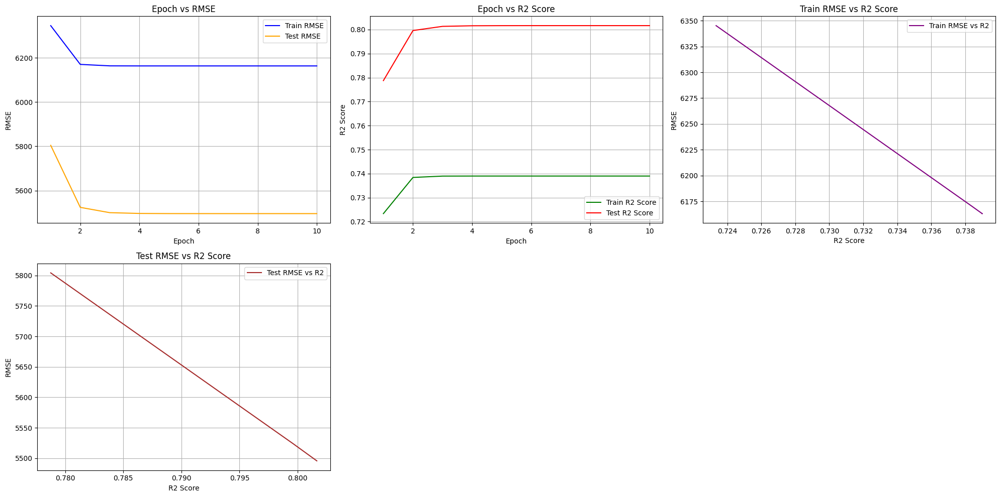

final RMSE:5495.676297908407
final r2 score0.8016489906602533


In [26]:
# @title
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

# Initialize SGDRegressor
sgd_reg = SGDRegressor(max_iter=1, eta0=0.01, learning_rate='constant', penalty='l2', random_state=42, warm_start=True)

n_epochs = 10
n_features = X_train.shape[1]

# Feature names
feature_names = X_train.columns if isinstance(X_train, pd.DataFrame) else [f"Feature {i+1}" for i in range(n_features)]

# Track metrics over epochs
train_rmse = []
train_r2 = []
test_rmse = []
test_r2 = []

# Loop over epochs
for epoch in range(n_epochs):
    # Perform one epoch of training
    sgd_reg.partial_fit(X_train, y_train)

    # Predictions for train and test sets
    y_pred_train = sgd_reg.predict(X_train)
    y_pred_test = sgd_reg.predict(X_test)

    # Calculate RMSE and R2 for train set
    train_rmse_epoch = np.sqrt(mean_squared_error(y_train, y_pred_train))
    train_r2_epoch = r2_score(y_train, y_pred_train)
    train_rmse.append(train_rmse_epoch)
    train_r2.append(train_r2_epoch)

    # Calculate RMSE and R2 for test set
    test_rmse_epoch = np.sqrt(mean_squared_error(y_test, y_pred_test))
    test_r2_epoch = r2_score(y_test, y_pred_test)
    test_rmse.append(test_rmse_epoch)
    test_r2.append(test_r2_epoch)

# After all epochs, create final summary plots for train and test sets
plt.figure(figsize=(20, 10))

# Plot 1: RMSE vs Epochs (Train and Test)
plt.subplot(2, 3, 1)
plt.plot(range(1, n_epochs + 1), train_rmse, label='Train RMSE', color='blue')
plt.plot(range(1, n_epochs + 1), test_rmse, label='Test RMSE', color='orange')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.title('Epoch vs RMSE')
plt.legend()
plt.grid()

# Plot 2: R2 Score vs Epochs (Train and Test)
plt.subplot(2, 3, 2)
plt.plot(range(1, n_epochs + 1), train_r2, label='Train R2 Score', color='green')
plt.plot(range(1, n_epochs + 1), test_r2, label='Test R2 Score', color='red')
plt.xlabel('Epoch')
plt.ylabel('R2 Score')
plt.title('Epoch vs R2 Score')
plt.legend()
plt.grid()

# Plot 3: RMSE vs R2 Score (Train) - Line Plot
plt.subplot(2, 3, 3)
plt.plot(train_r2, train_rmse, color='purple', label='Train RMSE vs R2')
plt.xlabel('R2 Score')
plt.ylabel('RMSE')
plt.title('Train RMSE vs R2 Score')
plt.legend()
plt.grid()

# Plot 4: RMSE vs R2 Score (Test) - Line Plot
plt.subplot(2, 3, 4)
plt.plot(test_r2, test_rmse, color='brown', label='Test RMSE vs R2')
plt.xlabel('R2 Score')
plt.ylabel('RMSE')
plt.title('Test RMSE vs R2 Score')
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()


print(f"final RMSE:{np.sqrt(mean_squared_error(y_test, y_pred_test))}")
print(f"final r2 score{r2_score(y_test, y_pred_test)}")

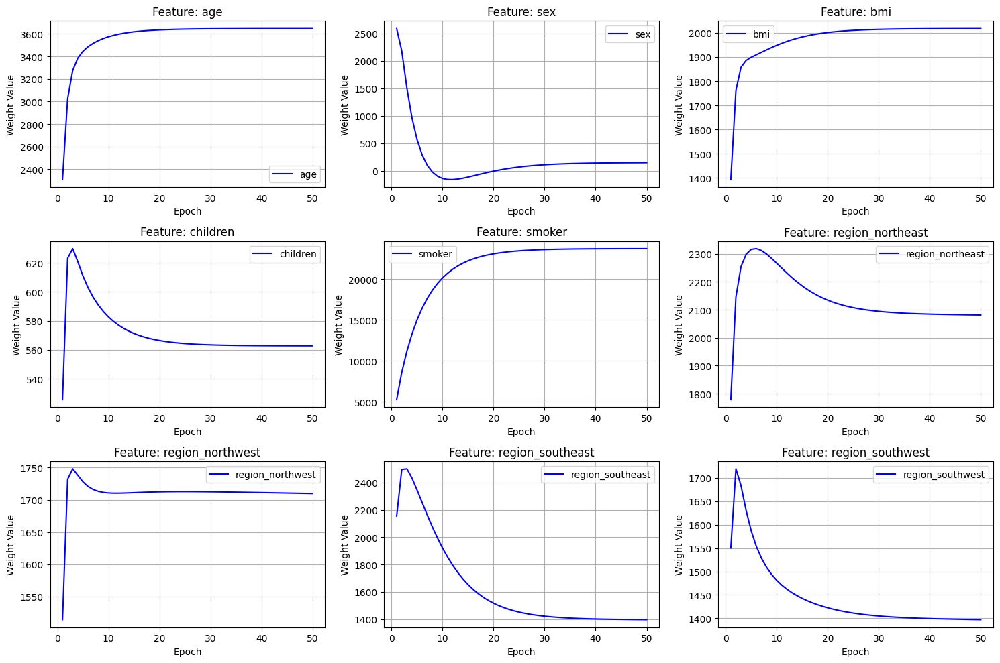

In [32]:
weights_over_epochs = np.array(weights_over_epochs)
n_epochs = 50
fig, axes = plt.subplots(3, 3, figsize=(15, 10))
axes = axes.flatten()
# Plot weights vs epochs for each feature
for i in range(n_features):
    axes[i].plot(range(1, n_epochs + 1), weights_over_epochs[:, i], label=feature_names[i], color='blue')
    axes[i].set_xlabel('Epoch')
    axes[i].set_ylabel('Weight Value')
    axes[i].set_title(f'Feature: {feature_names[i]}')  # Write feature name in the plot
    axes[i].grid()
    axes[i].legend(loc='best')


plt.tight_layout()
plt.show()


# D

# Weight Evolution Analysis During Training

## 1. Introduction

This analysis examines the evolution of weights for each feature over 50 epochs of gradient descent. The weight trends are plotted to observe how they stabilize as the model converges. The objective is to analyze the numerical trends of the weights during the training process and understand the meaning of their stabilization over epochs.

The features analyzed include:
- Continuous features: `age`, `bmi`
- Categorical features: `sex`, `smoker`, `children`, and `region` (one-hot encoded as `region_northeast`, `region_northwest`, etc.)

---

## 2. Observations and Trends

### General Observations
- **Early Epochs:** Weights undergo significant changes, reflecting the model's rapid learning phase as it adjusts to the data.
- **Intermediate Epochs:** Weight changes slow down, indicating the model is approaching convergence.
- **Later Epochs:** Weights stabilize near specific values, implying the model has learned the optimal coefficients for each feature.

---

### Feature-Wise Observations

#### **1. Age**
- The weight for `age` starts at a low value and increases steeply during the first 10 epochs.
- Stabilization occurs around epoch 20, with minimal changes afterward.
- This indicates `age` is positively correlated with the target variable, and its contribution is effectively captured early in training.

#### **2. BMI**
- The weight for `bmi` follows a similar trend to `age`, starting with a low value and increasing significantly during the first 10 epochs.
- Stabilization occurs slightly earlier, suggesting that the model captures the importance of `bmi` in fewer iterations.
- `bmi` is positively correlated with the target variable, and the stabilized weight reflects its contribution.

#### **3. Sex**
- The weight for the `sex` feature decreases rapidly in the first 10 epochs and then stabilizes near zero.
- This behavior indicates that `sex` has a negligible or weak impact on the target variable after the initial adjustments.

#### **4. Smoker**
- The weight for the `smoker` feature increases significantly and stabilizes at a high positive value.
- This behavior reflects a strong positive correlation between being a smoker and the target variable. The weight stabilizes around epoch 15, showing early convergence due to the feature's high predictive power.

#### **5. Children**
- The weight for `children` undergoes an unusual spike during the first 10 epochs before decreasing and stabilizing around a moderate value.
- This spike likely reflects initial overfitting or adjustments to outlier effects before stabilization.

#### **6. Region (One-Hot Encoded)**
- **Region_Northeast:** The weight increases during the first few epochs, peaks around epoch 10, and then decreases slightly before stabilizing.
- **Region_Northwest:** Similar behavior is observed, with the weight decreasing rapidly in early epochs before stabilizing.
- **Region_Southeast and Region_Southwest:** These features show rapid weight changes initially, followed by convergence to moderate negative values, indicating slight negative correlations with the target.

---

## 3. Phenomenon Observed

### Rapid Weight Changes in Early Epochs
- During the early stages of training, weights undergo significant changes as the model learns the relationships between features and the target variable. This is consistent with the high learning rate in the gradient descent algorithm during these phases.

### Stabilization of Weights
- The weights stabilize as the model converges, indicating the gradient updates become smaller as the loss function reaches a minimum. Stabilized weights represent the final coefficients learned by the model, which define the contribution of each feature to the target.

### Meaning of Weight Stabilization
- Stabilized weights signify that the model has achieved an optimal fit for the training data. The specific values of the weights indicate the importance and direction of the relationship between each feature and the target variable:
  - **Positive weights** (e.g., `age`, `smoker`) imply a positive relationship with the target.
  - **Negative weights** (e.g., certain regions) imply a negative relationship.
  - **Near-zero weights** (e.g., `sex`) suggest negligible influence on the target.

---

## 4. Conclusion

- The plots illustrate the evolution of weights over epochs, with significant adjustments in early training and stabilization in later stages.
- Features with strong correlations (e.g., `smoker`, `age`, `bmi`) stabilize quickly, while those with weaker or complex relationships (e.g., `region`, `children`) show more gradual adjustments.
- Stabilized weights provide insights into feature importance, with larger magnitudes indicating greater contributions to the target variable.
- The deliberate use of a low learning rate effectively captures the gradual learning process and highlights the stabilization phenomenon.

